# Разработка модели классификации патологий ВНЧС по снимкам с использованием нейронной сети YOLO.

**Объект исследования:** Изображения с патологиями ВНЧС. <br>
**Предмет исследования:** Детектирование и классификация патологий ВНЧС.<br>
**Цель работы:** Создание модели анализа данных сиспользованием глубокой сверточной нейронной сети YOLO для автоматизированной диагностики патологий ВНЧС по медицинским изображениям.<br>
**Задачи работы:**<br>
1.Изучить снимки спатологиями,выбрать метод обработки данных.<br>
2.Определить основные принципы выбранного метода анализа данных,метрики для оценки производительности и параметры работы сети.<br>
3.Сформировать,промаркировать и описать набор данных,выделить классы заболеваний,участвующие в исследовании.<br>
4.Выполнить предобработку данных.<br>
5.Обучить нейронную сеть YOLOv8.<br>
6.Протестировать обученную модель.<br>
7.Создать отчет о проделанной работе.

# Формирование набоора данных


Общий объем набора данных составляет 100 изображений.png с патологиями ВНЧС разделенных на 11 классов: <br>
1.sagittal_distal_position(SDP)<br>
2.sagittal_distraction(SD)<br>
3.sagittal_compression(SC)<br>
4sagittal_mesial_position(SMP)<br>
5.sagittal_norma(SN)<br>
6.axial_lateral_position(ALP)<br>
7.axial_medial_position(AMP)<br>
8.axial_norma(AN)<br>
9.coronal_lateral_position(CLP)<br>
10.coronal_medial_position(CMP)<br>
11.coronal_norma(CN)<br>

В случае задачи обработки изображений, для создания набора данных требуется произвести разметку изображений – выделить искомые объекты и распределить их на классы. Сделать это можно разными методами, например, ограничивающими прямоугольниками или полигонной разметкой. В данном исследовании был выбран метод ограничивающих прямоугольников. Метод ограничивающих прямоугольников заключается в выделении координат искомого объекта, а именно левого верхнего угла области и правого нижнего. Для обучения YOLO координаты объектов маркируются с помощью специальных тегов, соответствующих номеру класса, и записывают в txt-файлы. Для выполнения данной задачи можно использовать различные ПО, например Roboflow, CVAT, labelImg. В данном исследовании для маркировки изображений на классы использовалось ПО labelImg. Данная программа способна возвращать результат разметки в двух форматах (PascalVOC и YOLO). Формат YOLO представлен в виде текстового файла, в котором обозначен класс объекта и координаты прямоугольников, описанные значениями x,y,w,h в нормализованном виде. Помимо текстовых файлов с разметкой формата YOLO, также формируется файл classes.txt, в котором указан общий список классов промаркированных объектов. Порядковые номера имен классов объектов присваиваются по порядку при разметке изображений. По завершении разметки, количество файлов с разметкой должно соответствовать количеству изображений, с идентичными именами.

# Импорт необходимых библиотек, модели для обучения, а также распаковка набора данных


In [ ]:
from google.colab import files
from google.colab import drive
import os
import glob
from IPython.display import clear_output
import tensorflow as tf
from tensorflow.python.client import device_lib
drive.mount('/content/drive')
root = '/drive/My Drive/'

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Colab Notebooks/ARTdental/pathologies.zip'

Archive:  /content/drive/MyDrive/Colab Notebooks/ARTdental/pathologies.zip
   creating: pathologies/
   creating: pathologies/images/
  inflating: pathologies/images/К104Ла чис.png  
  inflating: pathologies/images/К104Ла.png  
  inflating: pathologies/images/К104Лк чис.png  
  inflating: pathologies/images/К104Лк.png  
  inflating: pathologies/images/К104Лс чис.png  
  inflating: pathologies/images/К104Лс.png  
  inflating: pathologies/images/К104Па чис.png  
  inflating: pathologies/images/К104Па.png  
  inflating: pathologies/images/К104Пк чис.png  
  inflating: pathologies/images/К104Пк.png  
  inflating: pathologies/images/К104Пс чис.png  
  inflating: pathologies/images/К104Пс.png  
  inflating: pathologies/images/К107Лс чис.png  
  inflating: pathologies/images/К107Лс.png  
  inflating: pathologies/images/К107Пс чис.png  
  inflating: pathologies/images/К107Пс.png  
  inflating: pathologies/images/К10Ла чис.png  
  inflating: pathologies/images/К10Ла.png  
  inflating: pathologi

In [ ]:
from IPython.display import clear_output
import cv2
!pip3 install google-colab
from google.colab.patches import cv2_imshow
clear_output()

In [ ]:
import cv2
!pip3 install google-colab
from google.colab.patches import cv2_imshow

import random
from PIL import Image, ImageDraw
import numpy as np
from numpy import int64
import matplotlib.pyplot as plt
import os
import glob
from imageio import imread
import cv2
from google.colab.patches import cv2_imshow
import imutils
import json

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.applications import VGG16, VGG19
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from tensorflow.keras import backend as K

import torch
from IPython.display import Image
import os
import random
import shutil
from sklearn.model_selection import train_test_split
import xml.etree.ElementTree as ET
from xml.dom import minidom
from tqdm import tqdm
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt

# Загрузка репозитория YOLOv8

Для модели анализа данных был выбран один из самых популярных алгоритмов детектирования, сегментации и классификации данных YOLO.
YOLO — это современная система обнаружения объектов. Она была разработана Джозефом Редмоном.  
Алгоритм YOLO использует принцип просмотра изображения только один раз, что существенно увеличивает скорость обработки данных. Исходное изображение сжимается таким образом, чтобы получить квадратную матрицу, в каждой клетке которой записана информация о наличии объекта и класса этого объекта на соответствующей части картинки.

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()
from IPython.display import clear_output

Ultralytics YOLOv8.1.41 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.3/201.2 GB disk)


In [ ]:
!git clone https://github.com/ultralytics/ultralytics.git
!pip install -r requirements.txt
!pip install ultralytics

Cloning into 'ultralytics'...
remote: Enumerating objects: 23605, done.
remote: Counting objects: 100% (634/634), done.
remote: Compressing objects: 100% (425/425), done.
remote: Total 23605 (delta 388), reused 369 (delta 209), pack-reused 22971
Receiving objects: 100% (23605/23605), 14.14 MiB | 9.89 MiB/s, done.
Resolving deltas: 100% (16491/16491), done.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


# Предобработка набора данных

Предобработка данных - неотъемлемый этап в анализе данных и построении моделей машинного обучения. Её цель заключается в тщательной подготовке данных для обеспечения точности, стабильности и эффективности последующего анализа и использования в моделях. Одной из ключевых задач предобработки является обнаружение и исправление ошибок в данных, таких как опечатки или неточности, что позволяет повысить качество результатов.

Для задачи обнаружения и классификации объектов с помощью модели YOLO необходимо создать собственный конфигурационный файл в формате YAML, который, используется для настройки параметров обучения модели, а в текущей задаче классификации изображений для выделения различных типов кожных заболеваний.  Изображения будут разделены на тренировочные (train), валидационные(val) и тестовые(test) подмножества, а nc и names указывают на количество классов и их названия.


In [ ]:
# Создаём файл для собственной структуры датасета
!touch /content/ultralytics/pat.yaml


In [ ]:
# Запишите в созданный файл (изображение ниже) следующий текст
# для этого можно просто двойным нажатием ЛКМ открыть его, вставить информацию
# и сохранить сочетанием ctrl+s
# Примерная структура датасета. В случае если называете директории по другому, измените их название
"""
train: ../data/images/train/
val:  ../data/images/val/
test: ../data/images/test/
# number of classes,
nc: 11,
# class names,
names: [""]
"""
# Записываем в созданный ранее файл структуру датасете
my_file = open('/content/ultralytics/pat.yaml','w+')
my_file.write('train: /content/ultralytics/pat/images/train/ \nval:  /content/ultralytics/pat/images/val/ \ntest: /content/ultralytics/pat/images/test/ \n# number of classes \nnc: 11 \n# class names \nnames: ["axial_norma", "axial_lateral_position", "axial_medial_position", "coronal_norma","coronal_lateral_position","coronal_medial_position","sagittal_norma","sagittal_compression","sagittal_distraction","sagittal_distal_position","sagittal_mesial_position"]')

440

In [ ]:
# Проверка записи в файл custom.yaml структуры. Если вывод пустой, повторно запустите предыдущую ячейку
my_file.readlines()

['train: /content/ultralytics/pat/images/train/ \n',
 'val:  /content/ultralytics/pat/images/val/ \n',
 'test: /content/ultralytics/pat/images/test/ \n',
 '# number of classes \n',
 'nc: 11 \n',
 '# class names \n',
 'names: ["axial_norma", "axial_lateral_position", "axial_medial_position", "coronal_norma","coronal_lateral_position","coronal_medial_position","sagittal_norma","sagittal_compression","sagittal_distraction","sagittal_distal_position","sagittal_mesial_position"]']

In [ ]:
# Функция для копирования файлов
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.copy(f, destination_folder)
        except:
            print(f)
            assert False

In [ ]:
# Создаём папки для хранения датасета на "внешнем" хранилище, чтобы можно было их изменять
!mkdir /content/ultralytics/pat
!mkdir /content/ultralytics/pat/images /content/ultralytics/pat/labels

In [ ]:
originImgs ="/content/pathologies/images/"
originLabls = "/content/pathologies/labels/"

#Создаём пустые списки для хранения путей к изображениям и разметкам
images = []
annotations = []

#Копируем изображения из "внутреннего" датасета в ранее созданные папки
for fl in sorted(os.listdir(originImgs)):
    images.append(originImgs+fl)
move_files_to_folder(images,"/content/ultralytics/pat/images")
for fl in sorted(os.listdir(originLabls)):
    annotations.append(originLabls+fl)
move_files_to_folder(annotations,"/content/ultralytics/pat/labels")

In [ ]:
# Проверка наличия файлов. Количество файлов должно совпадать
!ls /content/ultralytics/pat/labels/
print('-----------------')
!ls /content/ultralytics/pat/images/

 К104Ла.txt	   К10Па.txt	     К13Лс.txt	       К171Па.txt	 К185Пс.txt
'К104Ла чис.txt'  'К10Па чис.txt'   'К13Лс чис.txt'   'К171Па чис.txt'	'К185Пс чис.txt'
 К104Лк.txt	   К10Пк.txt	     К13Па.txt	       К171Пк.txt	 К18Лс.txt
'К104Лк чис.txt'  'К10Пк чис.txt'   'К13Па чис.txt'   'К171Пк чис.txt'	'К18Лс чис.txt'
 К104Лс.txt	   К128Лс.txt	     К151Ла.txt        К172Пс.txt	 К18Пс.txt
'К104Лс чис.txt'  'К128Лс чис.txt'  'К151Ла чис.txt'  'К172Пс чис.txt'	'К18Пс чис.txt'
 К104Па.txt	   К137Ла.txt	     К151Лк.txt        К175Ла.txt	 К207Пс.txt
'К104Па чис.txt'  'К137Ла чис.txt'  'К151Лк чис.txt'  'К175Ла чис.txt'	'К207Пс чис.txt'
 К104Пк.txt	   К137Лк.txt	     К151Па.txt        К175Лк.txt	 К22Лс.txt
'К104Пк чис.txt'  'К137Лк чис.txt'  'К151Па чис.txt'  'К175Лк чис.txt'	'К22Лс чис.txt'
 К104Пс.txt	   К137Па.txt	     К151Пк.txt        К175Па.txt	 К22Пс.txt
'К104Пс чис.txt'  'К137Па чис.txt'  'К151Пк чис.txt'  'К175Па чис.txt'	'К22Пс чис.txt'
 К107Лс.txt	   К137Пк.txt	     К153Пс.txt        К17

In [ ]:
class_name_to_id_mapping = {
    "axial_norma": 0,
    "axial_lateral_position": 1,
    "axial_medial_position": 2,
    "coronal_norma": 3,
    "coronal_lateral_position": 4,
    "coronal_medial_position": 5,
    "sagittal_norma": 6,
    "sagittal_compression": 7,
    "sagittal_distraction": 8,
    "sagittal_distal_position": 9,
    "sagittal_mesial_position": 10
}

# Инвертируем словарь, чтобы получить отображение из ID в название класса
class_id_to_name_mapping = {id: name for name, id in class_name_to_id_mapping.items()}

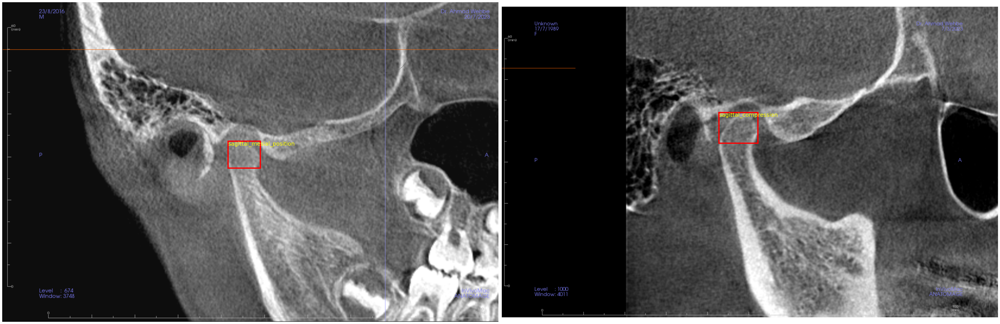

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import random
def plot_bounding_boxes(image_dir, annotation_dir, num_images=2):
    # Проверяем, существуют ли указанные директории
    assert os.path.isdir(image_dir), f"{image_dir} is not a directory."
    assert os.path.isdir(annotation_dir), f"{annotation_dir} is not a directory."

    annotations = os.listdir(annotation_dir)
    fig, axs = plt.subplots(1, num_images, figsize=(15 * 3, 5 * 3))

    for i in range(num_images):
        annotation_file = random.choice(annotations)
        annotation_path = os.path.join(annotation_dir, annotation_file)

        with open(annotation_path, "r") as file:
            annotation_list = [line.strip().split() for line in file.readlines()]
            annotation_list = [[float(num) for num in line] for line in annotation_list if line]

        image_file = annotation_file.replace("labels", "images").replace("txt", "png")
        image_path = os.path.join(image_dir, image_file)

        image = Image.open(image_path)
        w, h = image.size

        for ann in annotation_list:
            obj_cls, x_center, y_center, bbox_width, bbox_height = ann
            x0 = (x_center - bbox_width / 2) * w
            y0 = (y_center - bbox_height / 2) * h
            rect_width = bbox_width * w
            rect_height = bbox_height * h

            # Увеличиваем толщину рамки
            rect = patches.Rectangle((x0, y0), rect_width, rect_height, linewidth=4, edgecolor='red', facecolor='none')
            axs[i].add_patch(rect)

            class_name = class_id_to_name_mapping.get(int(obj_cls), 'Unknown')
            # Увеличиваем размер текста подписи и убираем подложку
            axs[i].text(x0, y0, class_name, fontsize=18, color='yellow', verticalalignment='top')

        axs[i].imshow(np.array(image))
        axs[i].axis('off')  # Скрываем оси

    plt.tight_layout()
    plt.show()

image_dir = '/content/ultralytics/pat/images'
annotation_dir = '/content/ultralytics/pat/labels'

plot_bounding_boxes(image_dir, annotation_dir)

Вывод изображения с отрисованными на нем прямоугольниками и классами объектов после обработки разметки служит для визуализации того, как модель будет видеть и интерпретировать объекты в данных обучения. Это может быть полезно для отладки и проверки корректности разметки. Если есть какие-то проблемы с разметкой или преобразованием данных, они могут быть выявлены и исправлены на этапе предварительной обработки данных.

**Разделение набора данных на выборки.** <br>
Разделение набора данных на обучающую (train), валидационную (val) и тестовую (test) выборки — является фундаментальной практикой в машинном обучении, которая помогает оценить производительность модели.<br>
Обучающая выборка используется для обучения модели, где она изучает закономерности и шаблоны в данных. Валидационная выборка применяется для настройки гиперпараметров и оценки производительности модели в процессе обучения, предотвращая переобучение и обеспечивая лучшую обобщающую способность. Тестовая выборка используется для окончательной оценки обобщающей способности модели на новых данных, обеспечивая проверку ее устойчивости и надежности.<br>
Разделение на выборки  будет происходить в следующем соотношении: 80% данных будут использованы для обучения (train) и 20% данных будут выделены для тестирования, 50% из которых будет выделены для тестовой выборки (test), а оставшиеся 50% останутся в валидационной выборке (val).


In [ ]:
# Заносим пути к файлам изображений и разметки
images = [os.path.join('/content/ultralytics/pat/images', x) for x in os.listdir('/content/ultralytics/pat/images')]
annotations = [os.path.join('/content/ultralytics/pat/labels', x) for x in os.listdir('/content/ultralytics/pat/labels') if x[-3:] == "txt"]

# Сортировка файлов
images.sort()
annotations.sort()

# Разделение датасета на обучающую, валидационную и тестовую выборки
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.3, random_state = 1)
val_images, test_images, val_annotations, test_annotations = train_test_split(val_images, val_annotations, test_size = 0.5, random_state = 1)



# Создаём папки для хранения выборок
!mkdir /content/ultralytics/pat/images/train/ /content/ultralytics/pat/images/val/ /content/ultralytics/pat/images/test/ /content/ultralytics/pat/labels/train/ /content/ultralytics/pat/labels/val/ /content/ultralytics/pat/labels/test/
# Функция для переноса файлов
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

# Перенос выборок в соответствующие папки
move_files_to_folder(train_images, '/content/ultralytics/pat/images/train/')
move_files_to_folder(val_images, '/content/ultralytics/pat/images/val/')
move_files_to_folder(test_images, '/content/ultralytics/pat/images/test/')
move_files_to_folder(train_annotations, '/content/ultralytics/pat/labels/train/')
move_files_to_folder(val_annotations, '/content/ultralytics/pat/labels/val/')
move_files_to_folder(test_annotations, '/content/ultralytics/pat/labels/test/')

In [ ]:
# Проверяем содержание тестовой выборки
!ls /content/ultralytics/pat/labels/test/
print('-------------')
!ls /content/ultralytics/pat/images/test/

'К104Лк чис.txt'   К137Пк.txt	    'К151Ла чис.txt'   К175Пк.txt  'К245Пс чис.txt'
'К104Пс чис.txt'   К138Па.txt	     К151Пк.txt        К185Пс.txt  'К253Пс чис.txt'
 К10Лк.txt	  'К138Пк чис.txt'  'К171Пк чис.txt'   К245Пс.txt   К294Пс.txt
-------------
'К104Лк чис.png'   К137Пк.png	    'К151Ла чис.png'   К175Пк.png  'К245Пс чис.png'
'К104Пс чис.png'   К138Па.png	     К151Пк.png        К185Пс.png  'К253Пс чис.png'
 К10Лк.png	  'К138Пк чис.png'  'К171Пк чис.png'   К245Пс.png   К294Пс.png


# Обучение модели<br>


Обучение сверточной сети YOLO обычно включает в себя несколько этапов, начиная с подготовки данных и заканчивая обучением и оценкой модели.<br>
**Метрики для оценки производительности YOLO.** <br>
Для оценки результатов обучения и тестирования модели YOLO для обнаружения патологий ВНЧС был применен ряд стандартных метрик, используемых для оценки производительности моделей машинного обучения.<br>
 Для каждого класса в наборе данных предоставляется следующие метрики:<br>
**1.	 P (Precision):** Точность модели, показывает долю правильных предсказаний среди всех предсказанных моделью положительных результатов.<br>
**2.	R (Recall):** Полнота модели, показывает долю обнаруженных моделью положительных случаев среди всех истинных положительных случаев.<br>
**3.	mAP50:** Средняя точность модели при пороге IoU (Intersection over Union) 0.5. Это показатель, который учитывает и точность, и полноту, и является стандартным для оценки детекторов объектов.<br>
**4.	mAP50-95:** Средняя точность модели, рассчитанная для различных пороговых значений IoU, варьирующихся от 0,50 до 0,95. Оно дает полное представление о производительности модели на разных уровнях сложности обнаружения.

In [ ]:
# Переходим в директорию yolov8
%cd /content/ultralytics

/content/ultralytics


In [ ]:
# Train YOLOv8n on COCO128 for 300 epochs
!yolo train model=yolov8s.pt data=/content/ultralytics/pat.yaml epochs=70 imgsz=512 batch=32 workers=24

100% 21.5M/21.5M [00:00<00:00, 318MB/s]
Ultralytics YOLOv8.1.41 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/ultralytics/pat.yaml, epochs=70, time=None, patience=100, batch=32, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=24, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fa

Общая точность 0.932 и полнота 0.831 указывают на высокую общую производительность модели. Модель эффективно идентифицирует большую часть объектов и точно определяет их расположение. <br>
Общая mAP50 0.995 и mAP50-95 0.848 также подчеркивают надежность модели в задаче обнаружения кожных заболеваний на представленном наборе данных.<br>
Графические результаты, полученные при обучении модели, будут продеманстрированы ниже.

In [ ]:
# Сохраняем лучшие веса в нашу папку на диске для дальнейшего использования
from google.colab import drive
import shutil


# Путь к исходному файлу весов
source_path = '/content/ultralytics/runs/detect/train/weights/best.pt'

# Путь к целевой директории на Google Диске
destination_path = '/content/drive/MyDrive/Colab Notebooks/ARTdental/best.pt'

# Копируем файл
shutil.copy(source_path, destination_path)

print(f'Файл {source_path} успешно скопирован в {destination_path}')

Файл /content/ultralytics/runs/detect/train/weights/best.pt успешно скопирован в /content/drive/MyDrive/Colab Notebooks/ARTdental/best.pt


# Тестирование модели  на лучших весах

Тестирование сверточной сети YOLO представляет собой процесс оценки производительности обученной модели на новых, ранее не виденных ею данных. Этот этап важен для оценки обобщающей способности модели, выявления её недостатков и проверки насколько успешно обученная модель справляется с решением задачи обнаружения объектов.
Получим результаты тестирования для каждой модели YOLO и проанализируем их.


In [ ]:
!yolo val model="/content/ultralytics/runs/detect/train/weights/best.pt" data="/content/ultralytics/pat.yaml"

Ultralytics YOLOv8.1.41 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129841 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/ultralytics/pat/labels/val.cache... 15 images, 0 backgrounds, 0 corrupt: 100% 15/15 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:04<00:00,  4.90s/it]
                   all         15         15      0.932      0.831      0.995      0.848
axial_lateral_position         15          2      0.929          1      0.995      0.995
 axial_medial_position         15          2      0.926          1      0.995      0.895
         coronal_norma         15          3          1      0.549      0.995      0.785
coronal_lateral_position         15          1      0.879          1      0.995      0.895
coronal_medial_position         15          2      0.932          1      0.995      0.946
        sagittal_norma         15          1   

Общая точность и полнота для всех классов вместе составляют 0.932 и 0.831 соответственно, что свидетельствует о хорошем балансе между точностью и полнотой на всех классах. Это указывает на то, что модель хорошо идентифицирует и правильно классифицирует объекты.<br>
Средняя точность по всем классам (mAP) состовляет 0.995 при пороге IoU 0.5, что говорит о почти идеальной способности модели правильно локализовать и классифицировать объекты в большинстве случаев. При более строгих порогах IoU (mAP50-95) показатели немного ниже и равны 0,848 для всех классов, при этом также подтверждают высокую оценку модели.


In [ ]:
!yolo task=detect mode=predict model="/content/ultralytics/runs/detect/train/weights/best.pt" source="/content/ultralytics/pat/images/test"

Ultralytics YOLOv8.1.41 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129841 parameters, 0 gradients, 28.5 GFLOPs

image 1/15 /content/ultralytics/pat/images/test/К104Лк чис.png: 352x512 1 coronal_norma, 78.5ms
image 2/15 /content/ultralytics/pat/images/test/К104Пс чис.png: 352x512 1 sagittal_norma, 10.5ms
image 3/15 /content/ultralytics/pat/images/test/К10Лк.png: 352x512 1 coronal_lateral_position, 10.3ms
image 4/15 /content/ultralytics/pat/images/test/К137Пк.png: 352x512 1 coronal_medial_position, 10.4ms
image 5/15 /content/ultralytics/pat/images/test/К138Па.png: 352x512 1 axial_medial_position, 10.3ms
image 6/15 /content/ultralytics/pat/images/test/К138Пк чис.png: 352x512 1 coronal_medial_position, 10.3ms
image 7/15 /content/ultralytics/pat/images/test/К151Ла чис.png: 352x512 1 axial_medial_position, 10.3ms
image 8/15 /content/ultralytics/pat/images/test/К151Пк.png: 352x512 1 coronal_medial_position, 10.3ms
image 9/15 /content/ul

# Демонстрация результатов тестирования - детекция и классификация

Изображения предсказанных меток показывают,что модель способна локализовать,классифицировать и оценить, насколько алгоритм уверен в каждой конкретной классификации различных типов патологий ВНЧС. <br>
На изображениях ниже мы можем наглядно увидеть как работает обученная модель на новых данных.<br>
Ограничивающий прямоугольник показывает локацию нашего сустава.<br>
Подпись - указывает на конкретную патологию ВНЧС.<br>
Цифра рядом с патологией - указывает на вероятность данной патологии на конкретном снимке.

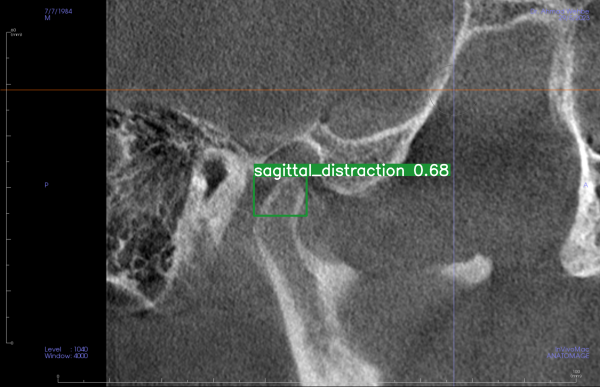

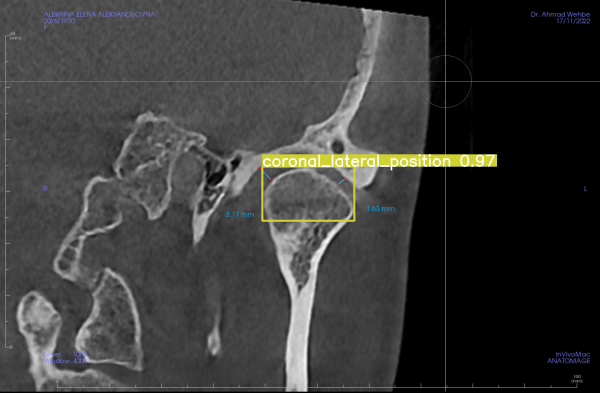

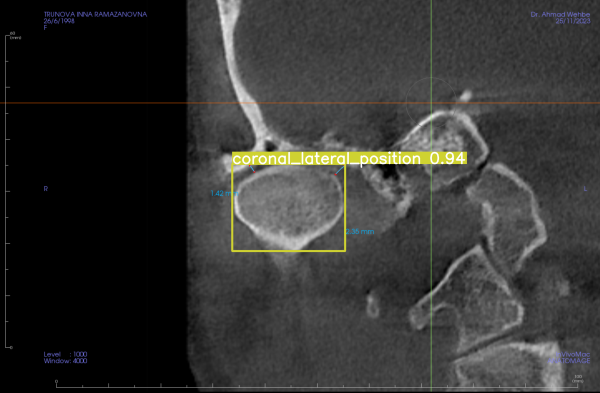

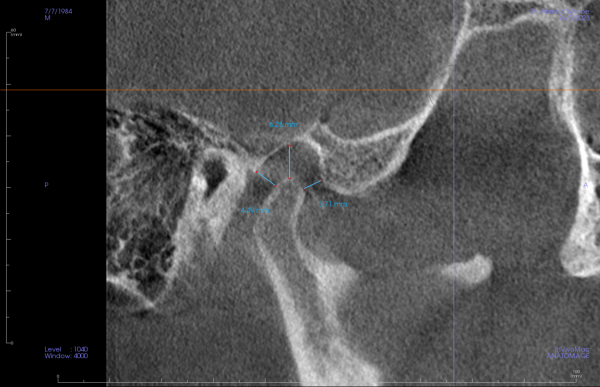

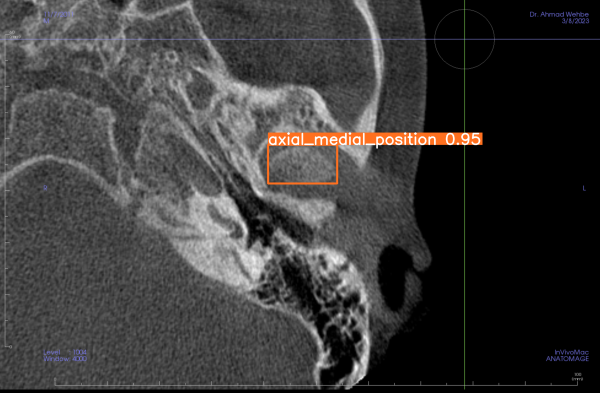

...

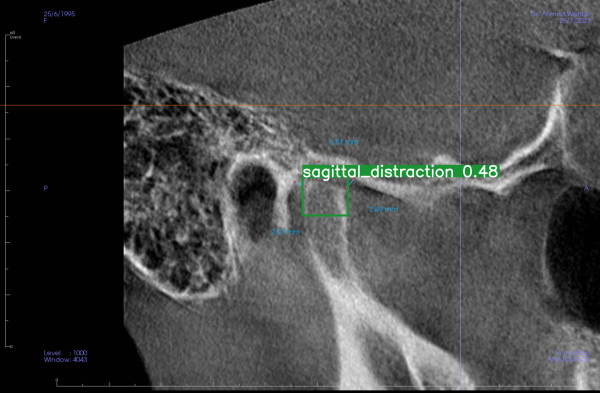

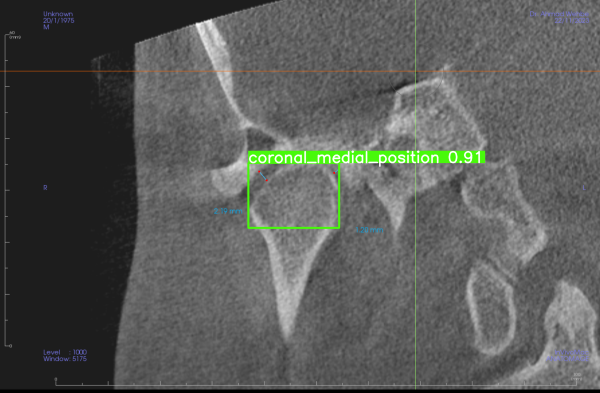

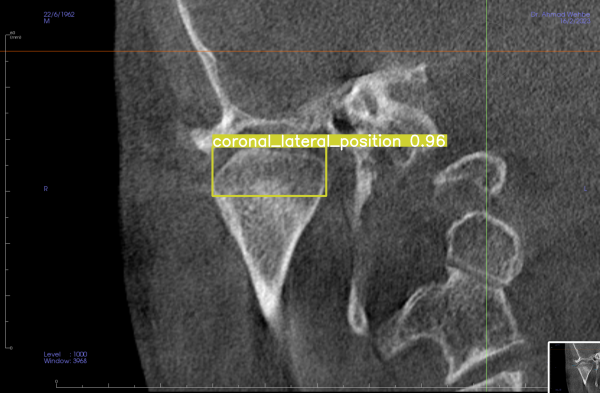

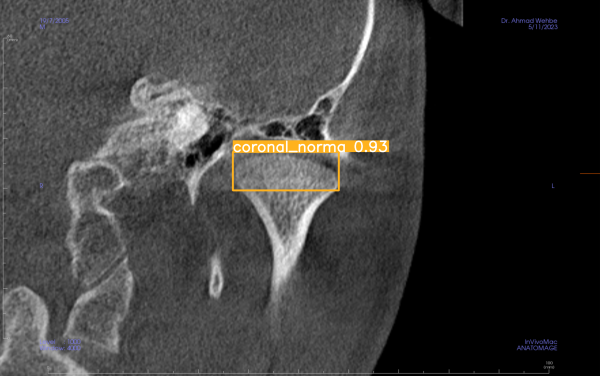

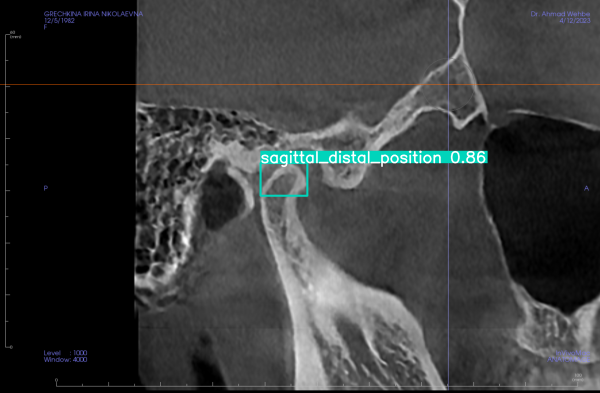

In [ ]:
# Определяем путь к тестовой выборке
detections_dir = "/content/ultralytics/runs/detect/predict/"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]


#cnt=0

#for fl in os.listdir(detections_dir):
  #if(cnt==20):
    #break
  #else:
    #img = cv2.imread(detections_dir+fl)
    #img = imutils.resize(img, width=600)
    #cv2_imshow(img)
    #cnt=cnt+1


# Вывод изображения с результатами детектирования
#random_detection_image = Image.open(random.choice(detection_images))
  # plt.figure(figsize = (30,10))
  # plt.imshow(np.array(random_detection_image))
for fl in os.listdir(detections_dir):
   img = cv2.imread(detections_dir+fl)
   img = imutils.resize(img, width=600)
   cv2_imshow(img)

# Выведем графические результаты для оценки производительности обучающей модели

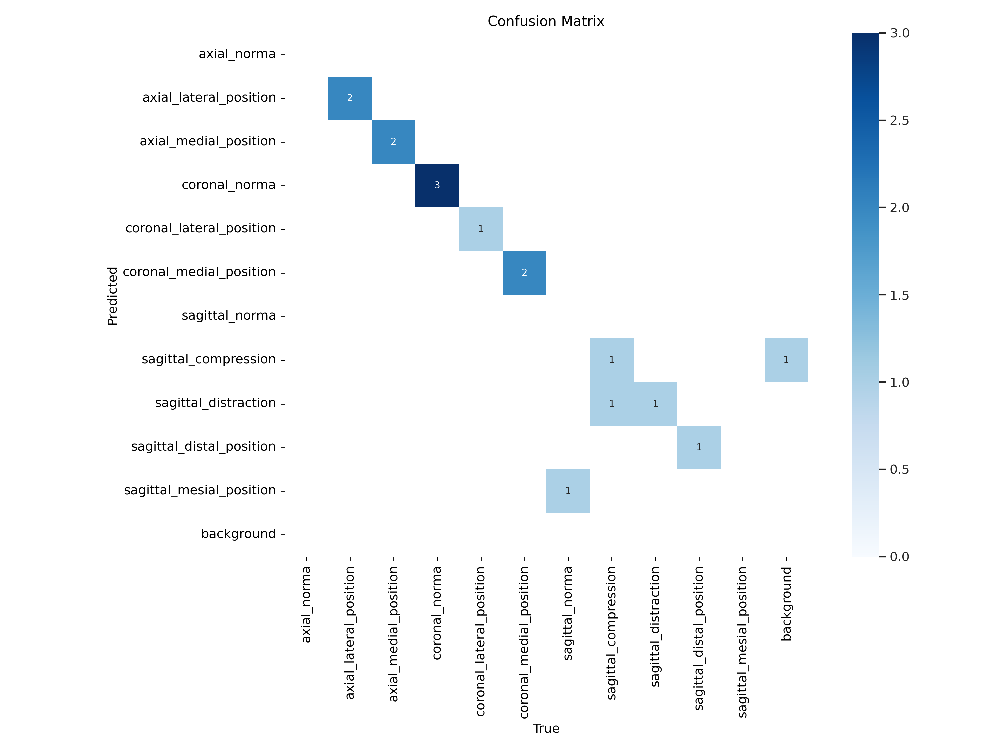

In [ ]:
# Выведем матрицу несоответствия, чтобы оценить наличие ложноположительных и ложноотрицательных результатов
from IPython.display import Image, display
image_path = '/content/ultralytics/runs/detect/train/confusion_matrix.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

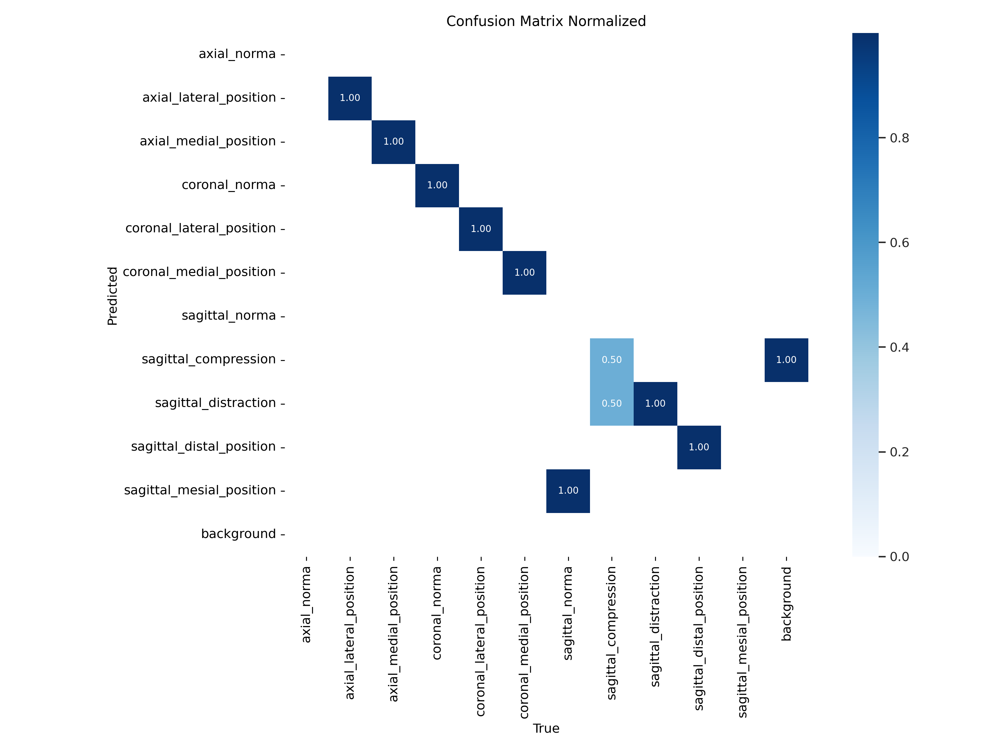

In [ ]:
# Выведем нормализованную матрицу несоответствия, чтобы оценить наличие ложноположительных и ложноотрицательных результатов
image_path = '/content/ultralytics/runs/detect/train/confusion_matrix_normalized.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

На представленной матрице ошибок(ConfusionMatrix)видно,что большинство классов были идеально классифицированы моделью,что показывает нормализованное значение 1.00 по диагонали,что означает 100% точность классификации для этих классов.
Требуется провести дополнительную работу для разрешения путаницы между классами sagittal_norma и sagittal_distraction.
Это может включать более детальный анализ этих классов,возможно улучшение аннотаций обучающего набора или введение дополнительных данных для обучения

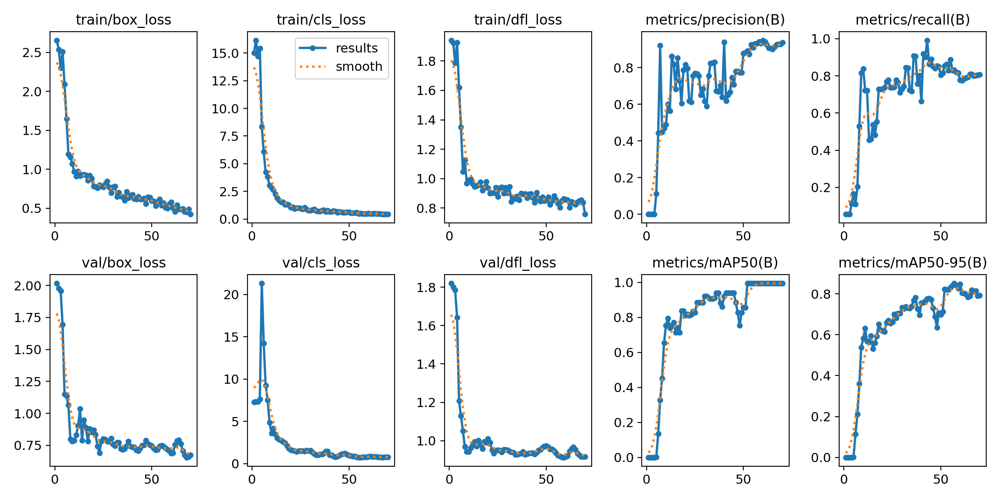

In [ ]:
# Выведем показатели точности обученной модели
image_path = '/content/ultralytics/runs/detect/train/results.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

На графиках представлены результаты обучения и тестирования модели YOLOv8 по различным метрикам. Верхний ряд графиков отображает значения на тренировочных данных (train), а нижний ряд — на валидационных данных (val).
Анализ графиков показывает, что модель обучается и улучшает свои показатели по всем фронтам: уменьшение ошибок предсказания, улучшение точности и полноты, а также повышение общей точности на заданных уровнях IoU.


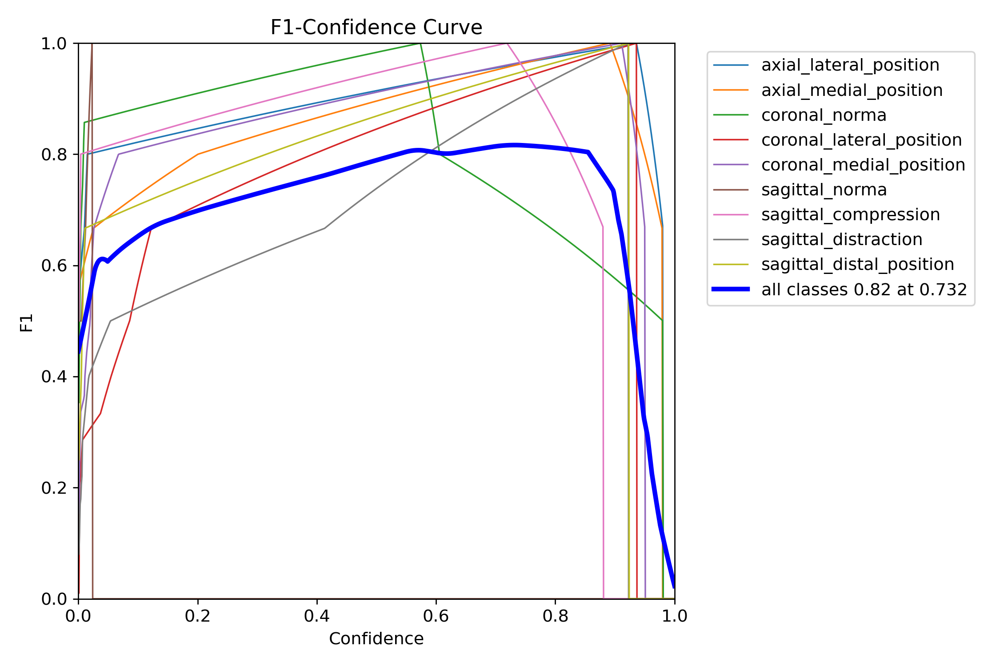

In [ ]:
# Выведем кривую F1 точности обученной модели,чтобы получить представление о балансе модели между ложноположительными и ложноотрицательными результатами при различных пороговых значениях
image_path = '/content/ultralytics/runs/detect/train/F1_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

Модель демонстрирует прекрасный баланс между точностью и полнотой. Среднее значение F1-меры для всех классов является высоким при уровне уверенности 0.732, что свидетельствуют о высокой точности модели на текущем наборе данных.

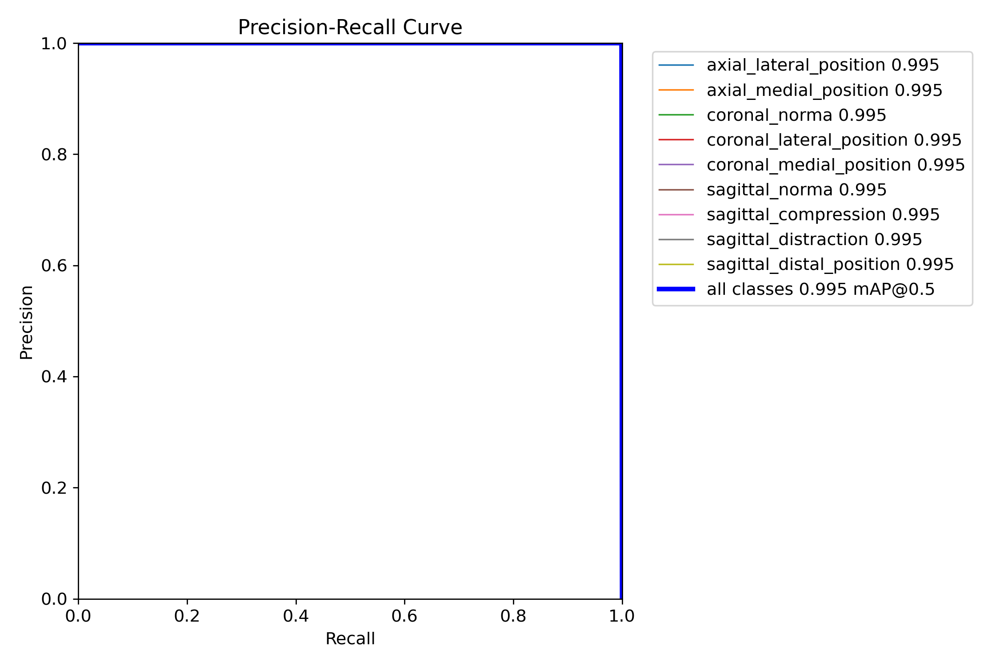

In [ ]:
# Выведем кривую  PR обученной модели,чтобы продемонстрировать компромисс между точностью и отзывом при различных пороговых значениях
image_path = '/content/ultralytics/runs/detect/train/PR_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

**Идеальные значения:** Показатели точности и полноты равны 1 (или очень близки к нему) для всех классов. Такое поведение указывает на то, что модель практически идеально классифицирует все классы в данном наборе данных.

**mAP@0.5:** Значение mAP@0.5 для всех классов составляет 0.995, что подтверждает высокую точность модели при пороге пересечения (IoU) в 0.5.

**Заключение:**
PR-кривые показывают, что модель работает с выдающимися результатами на данном наборе данных. Однако такие результаты могут быть индикатором переобучения, особенно если они не подтверждаются на более разнообразном или сложном наборе данных. Важно проверить эти результаты на независимом тестовом наборе, чтобы убедиться в обобщаемости модели.

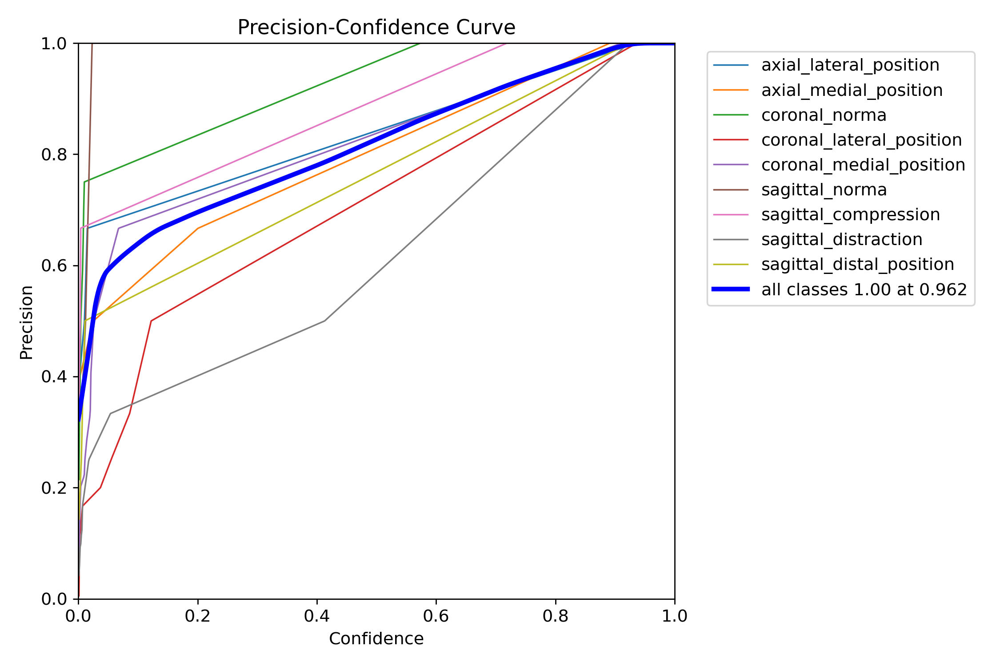

In [ ]:
#Выведем кривую  P обученной модели,чтобы понять, как меняется точность при изменении порога.
image_path = '/content/ultralytics/runs/detect/train/P_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))



В целом, для всех классов точность (precision) остаётся высокой при увеличении уверенности (confidence) до определённого порога, после чего начинает снижаться.<br>
Кривые для некоторых классов, таких как axial_lateral_position, axial_medial_position, coronal_lateral_position, coronal_medial_position, sagittal_compression, и sagittal_distal_position, показывают, что они достигают высокой точности при относительно низком уровне уверенности и сохраняют эту точность при увеличении уверенности до очень высокого уровня.<br>
Классы coronal_norma и sagittal_distraction имеют более низкую начальную точность при низких значениях уверенности, но их точность увеличивается с повышением уверенности, хотя и не достигает уровней других классов.<br>
Для sagittal_norma точность сильно колеблется, что может указывать на неоднородность или на меньшую надёжность классификации в этом классе.
Линия "all classes 1.00 at 0.962" показывает, что в среднем по всем классам модель достигает идеальной точности при уровне уверенности около 0.962.<br>
**Заключение:**
Модель в целом демонстрирует высокую точность по многим классам, особенно при высоком уровне уверенности. Тем не менее, для классов с более низкими начальными точностями возможно потребуются дополнительные усилия по улучшению качества классификации, включая возможно более тщательную очистку данных, дополнительное обучение или изменение порога уверенности для принятия решений.

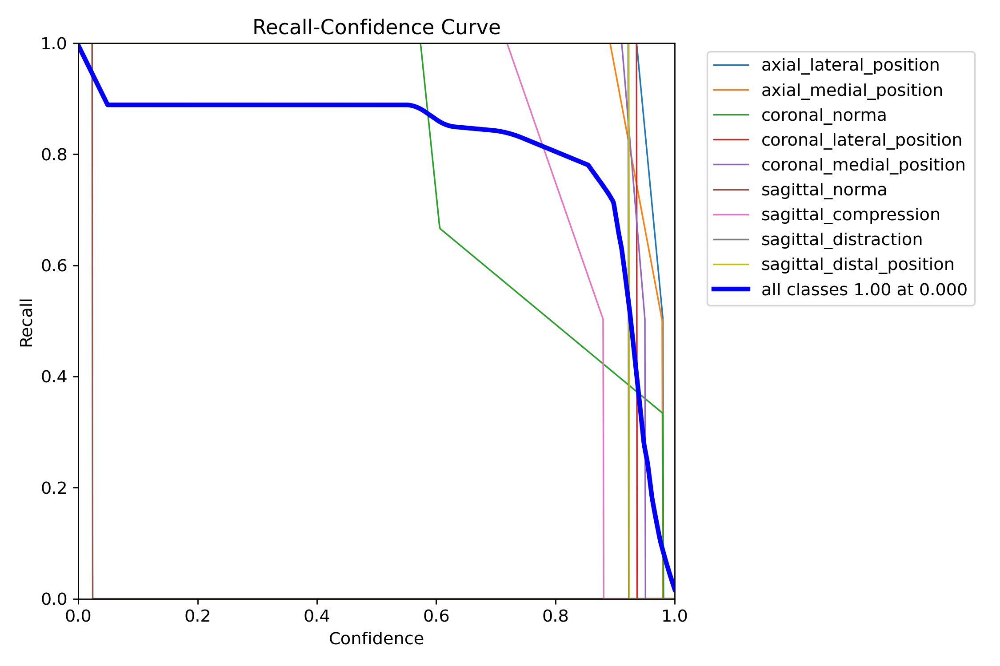

In [ ]:
#Выведем кривую  R обученной модели,чтобы показать, как изменяются показатели запоминания при разных пороговых значениях
image_path = '/content/ultralytics/runs/detect/train/R_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))


Для всех классов полнота (recall) остаётся на уровне 1.0 при низких порогах уверенности (confidence), что означает, что модель идентифицирует все положительные случаи.<br>
С увеличением порога уверенности полнота для большинства классов начинает снижаться, что указывает на то, что с повышением порога некоторые верные положительные случаи не обнаруживаются моделью.<br>
Для некоторых классов (например, sagittal_norma) наблюдается резкое падение полноты даже при небольшом увеличении порога уверенности. Это может указывать на нестабильность модели в отношении этих классов, особенно когда требуется большая уверенность в предсказаниях.<br>
Голубая линия, обозначающая среднюю полноту по всем классам, начинает с 1.00 при уверенности 0.00 и падает при увеличении уверенности.<br>
**Заключение:**
Модель обнаруживает большинство положительных случаев при низкой уверенности, что свидетельствует о хорошей чувствительности. Однако, при более высоких порогах уверенности возможно упущение некоторых положительных случаев, что приводит к снижению полноты. Это обычное явление, поскольку более высокий порог уверенности часто приводит к более консервативной модели, которая допускает меньше ложных срабатываний, но также может пропустить некоторые верные обнаружения. Важно найти баланс между уверенностью и полнотой, который лучше всего соответствует конкретным требованиям приложения.

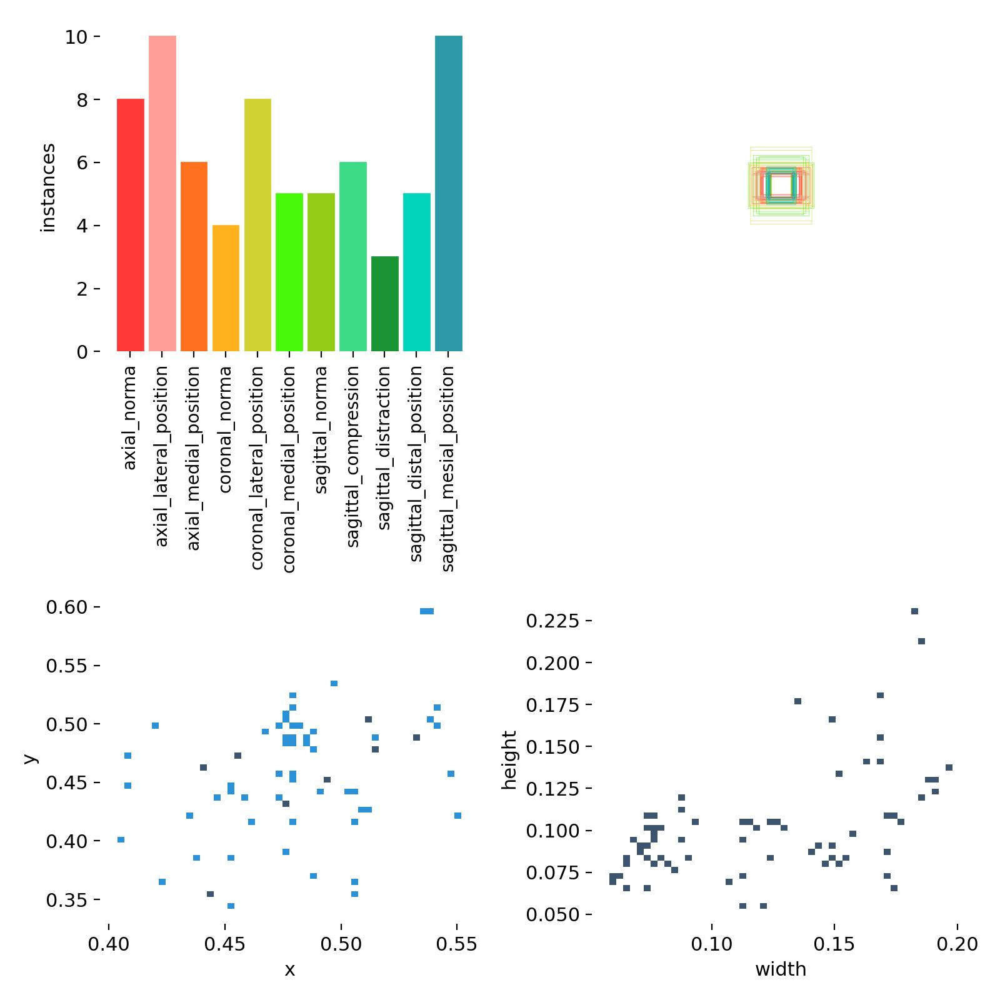

In [ ]:
#Выведем классы
image_path = '/content/ultralytics/runs/detect/train/labels.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

Изображение демонстрирует три разных вида графиков, которые могут быть использованы для анализа характеристик объектов, обнаруженных моделью обнаружения объектов:<br>

Гистограмма (вверху слева): Показывает количество экземпляров (instances) для каждого класса. Например, классы sagittal_distraction и axial_norma имеют самое большое количество экземпляров, что может указывать на их более частое встречаемость в данных или на предпочтение модели к этим классам. В то же время другие классы представлены меньшим числом экземпляров.<br>

Диаграмма рассеяния (внизу слева): Отображает распределение объектов по двум координатам (x и y), которые, вероятно, представляют нормализованные координаты центра ограничивающих рамок. Большая концентрация точек около середины графика указывает на то, что многие объекты расположены в центральной части изображения.<br>

Диаграмма рассеяния (внизу справа): Представляет взаимосвязь между шириной (width) и высотой (height) ограничивающих рамок. Видно, что большинство рамок имеют небольшую ширину и высоту, что может указывать на мелкие объекты или на то, что модель склонна обнаруживать объекты меньшего размера.

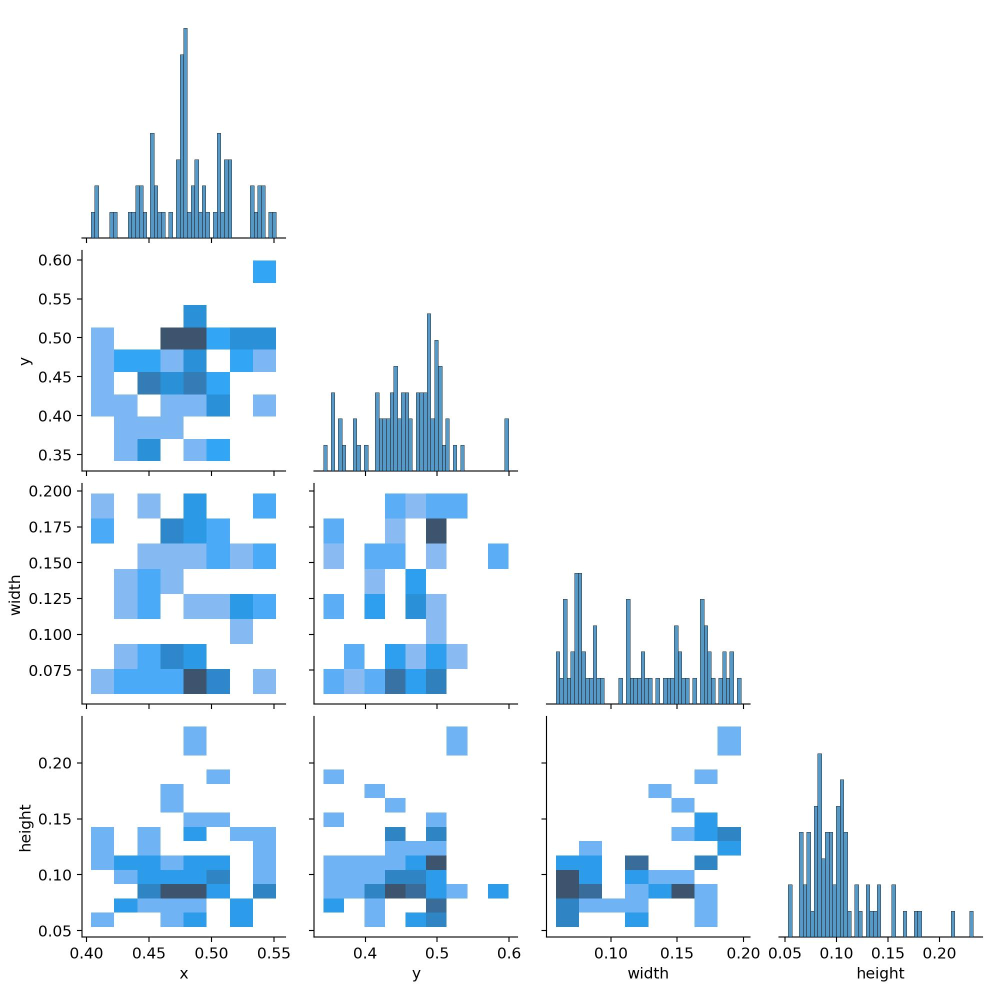

In [ ]:
#Выведем корреляцию классов
image_path = '/content/ultralytics/runs/detect/train/labels_correlogram.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

Этот график представляет собой матрицу диаграмм рассеяния и гистограмм, изображающую отношения между различными парами переменных, таких как x, y, width и height. Этот тип визуализации часто используется для анализа распределения и взаимосвязей между многомерными данными, в данном случае, для характеристик ограничивающих рамок в задачах компьютерного зрения. <br>


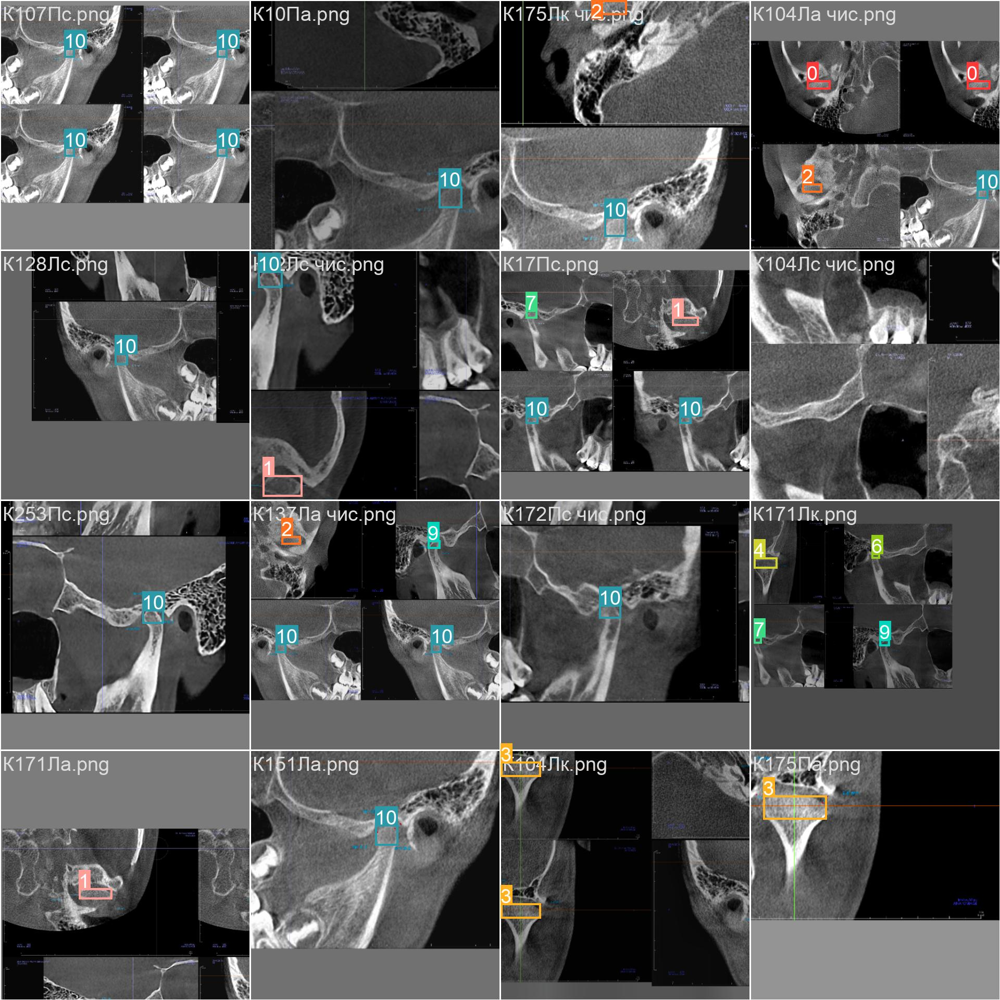

In [ ]:
#Результаты на обучающей выборке
image_path = '/content/ultralytics/runs/detect/train/train_batch0.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

**Примеры обучения нейронной сети.** <br>
На изображениях представлены результаты работы алгоритма обнаружения объектов на медицинских изображениях. На каждом изображении ограничивающие рамки (bounding boxes) используются для выделения различных патологий ВНЧС. Рамки разных цветов представляют разные классы или типы находок. Числа внутри рамок указывают на идентификатор класса, выявленного алгоритмом.

Анализ изображений показывает:

Рамки правильно расположены вокруг интересующих областей на изображениях, что говорит о способности алгоритма локализовать важные анатомические структуры.
Разноцветные рамки помогают различать разные типы находок или классы анатомии.
Наличие чисел в рамках предполагает, что модель классифицирует обнаруженные объекты.

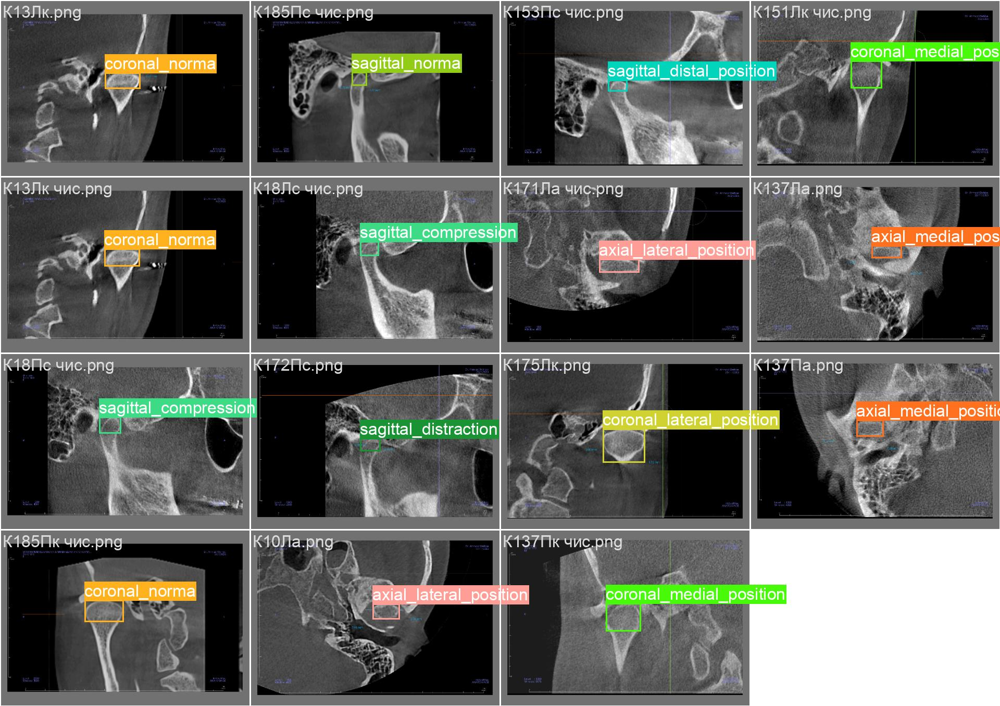

In [ ]:
#Результаты на валидационной выборке - ограничивающие прямоугольники - детектирование объектов
image_path = '/content/ultralytics/runs/detect/train/val_batch0_labels.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

**Примеры тестирования сети на валидационном наборе данных.** <br>
На изображениях представлены результаты работы алгоритма обнаружения объектов и истинные метки. На каждом изображении ограничивающие рамки (bounding boxes) используются для выделения различных патологий ВНЧС. Рамки разных цветов представляют разные классы или типы находок.Подпись к рамке указывает на выявленную патологию.

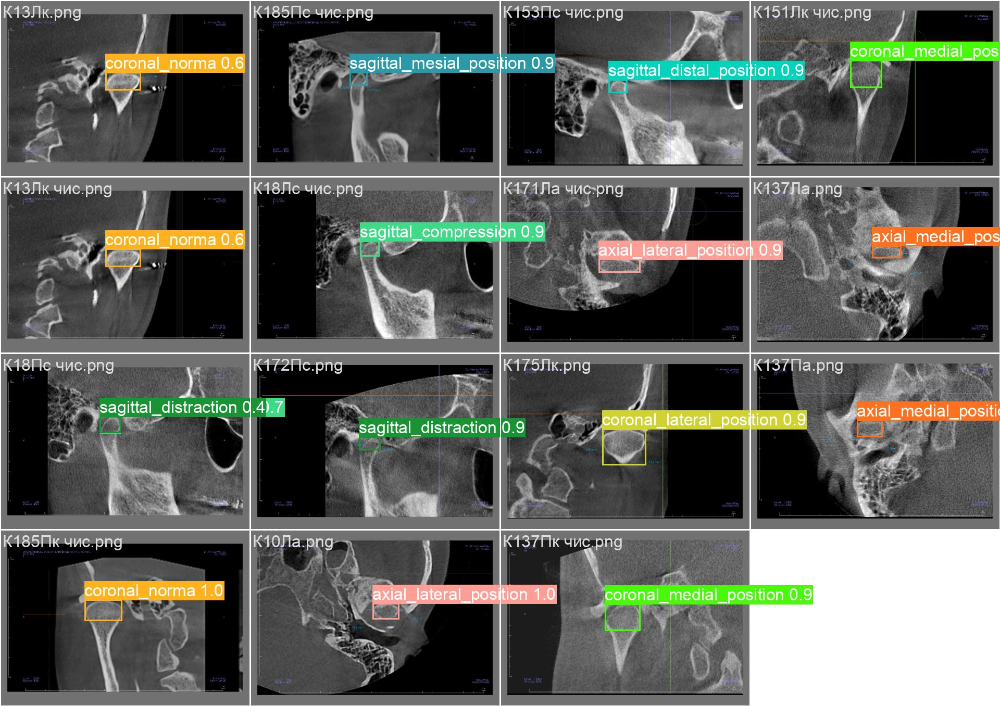

In [ ]:
#Результаты на валидационной выборке - ограничивающие прямоугольники - классификация и предсказание
image_path = '/content/ultralytics/runs/detect/train/val_batch0_pred.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

**Примеры тестирования сети на валидационном наборе данных.** <br>
На изображениях представлены результаты работы алгоритма обнаружения объектов и предсказанные метки. На каждом изображении ограничивающие рамки (bounding boxes) используются для выделения различных патологий ВНЧС. Рамки разных цветов представляют разные классы или типы находок.Подпись к рамке указывает на выявленную патологию, а также оценивает ее вероятность.

# Выведем графические результаты валидационной модели

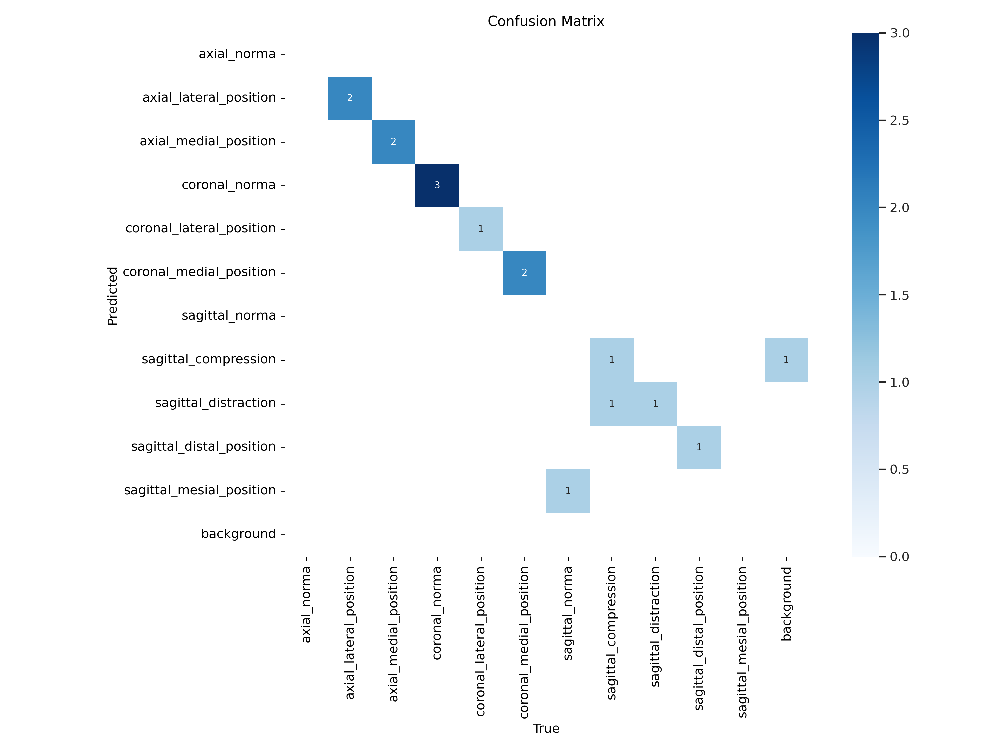

In [ ]:
# Выведем матрицу несоответствия, чтобы оценить наличие ложноположительных и ложноотрицательных результатов
from IPython.display import Image, display
image_path = '/content/ultralytics/runs/detect/val/confusion_matrix.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

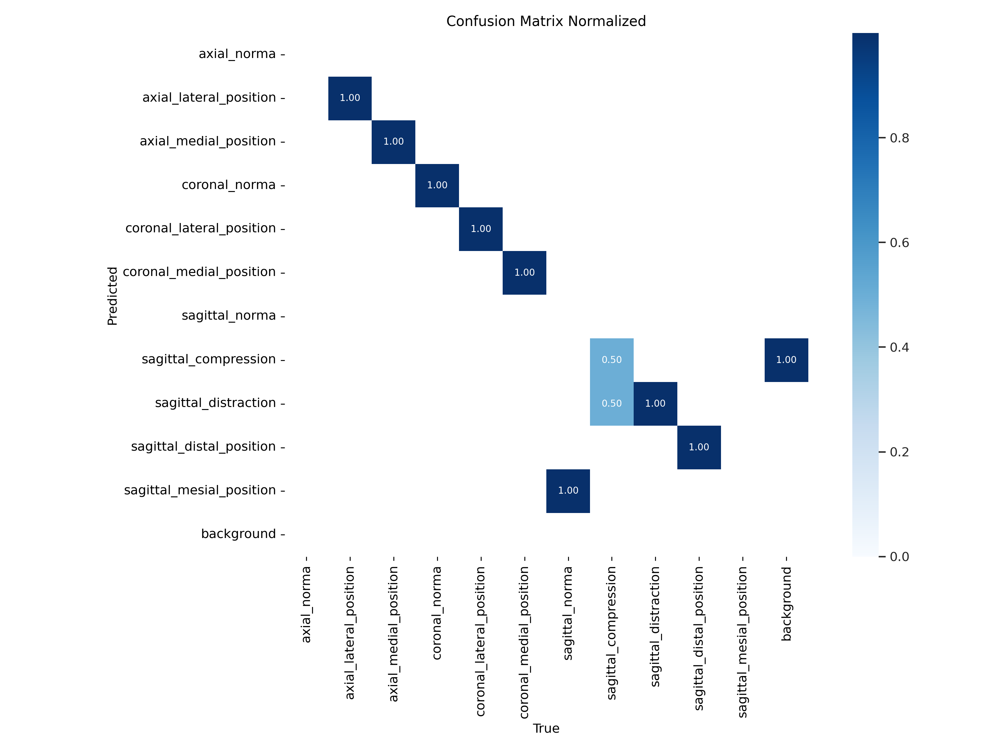

In [ ]:
# Выведем нормализованную матрицу несоответствия, чтобы оценить наличие ложноположительных и ложноотрицательных результатов
from IPython.display import Image, display
image_path = '/content/ultralytics/runs/detect/val/confusion_matrix_normalized.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

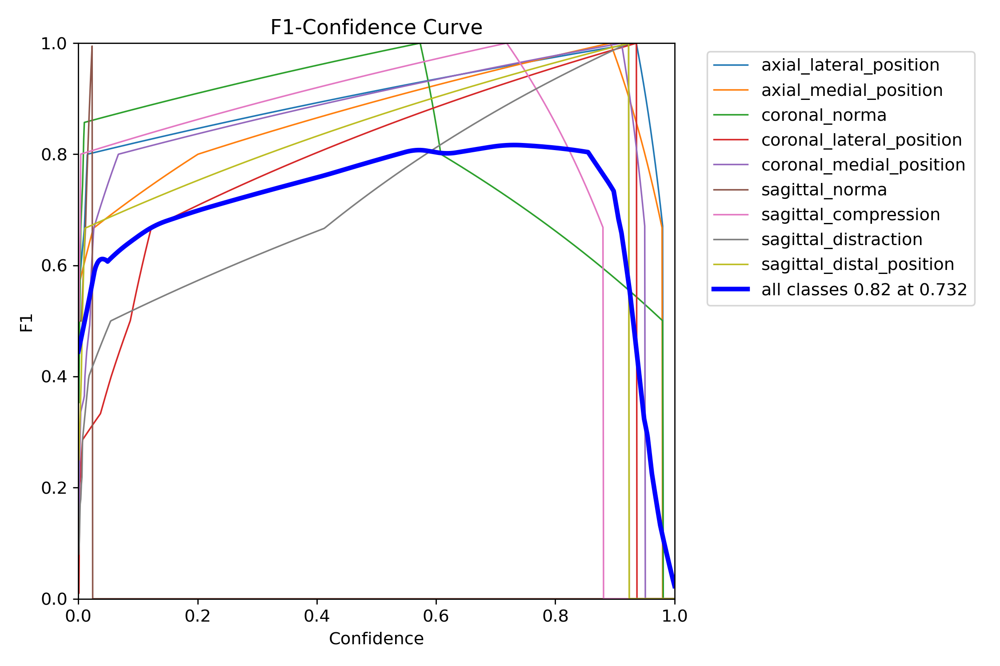

In [ ]:
# Выведем кривую F1 точности валидационной модели,чтобы получить представление о балансе модели между ложноположительными и ложноотрицательными результатами при различных пороговых значениях
image_path = '/content/ultralytics/runs/detect/val/F1_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

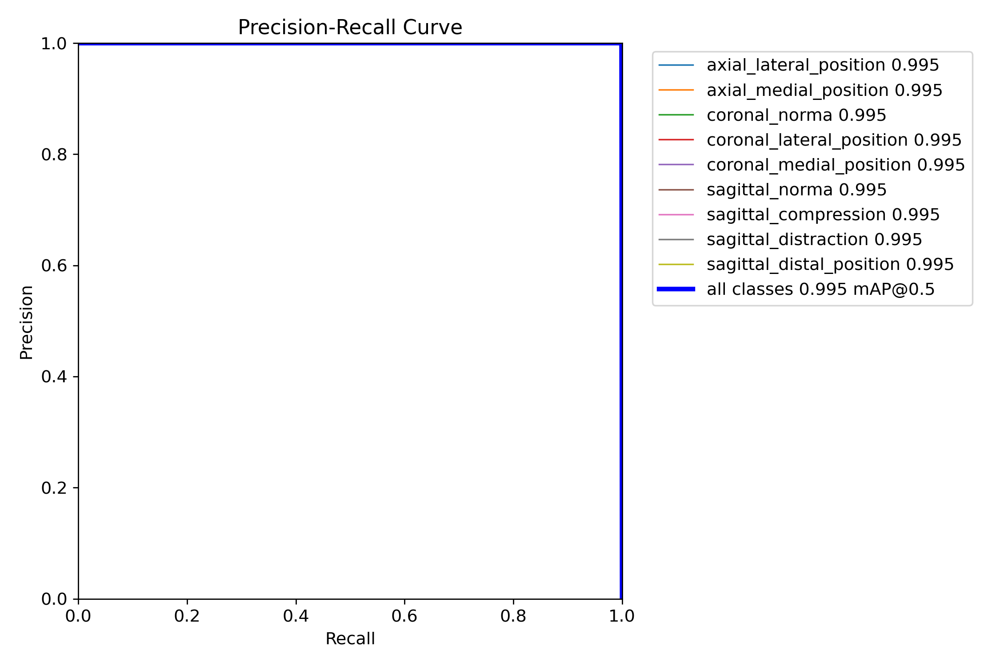

In [ ]:
# Выведем кривую  PR валидационной модели,чтобы продемонстрировать компромисс между точностью и отзывом при различных пороговых значениях
image_path = '/content/ultralytics/runs/detect/val/PR_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

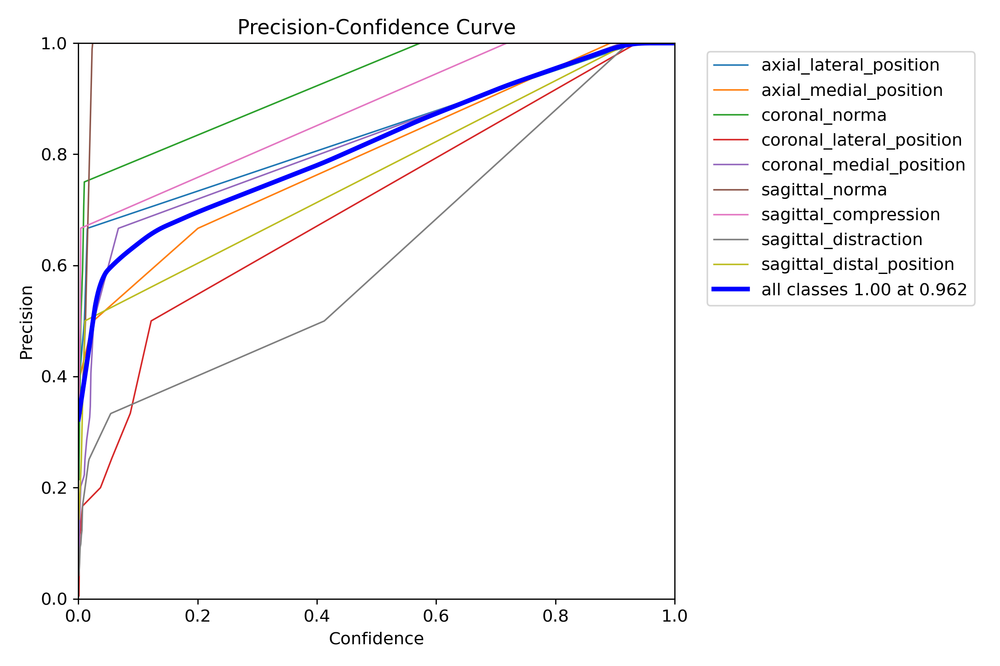

In [ ]:
#Выведем кривую  P обученной модели,чтобы понять, как меняется точность при изменении порога.
image_path = '/content/ultralytics/runs/detect/val/P_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

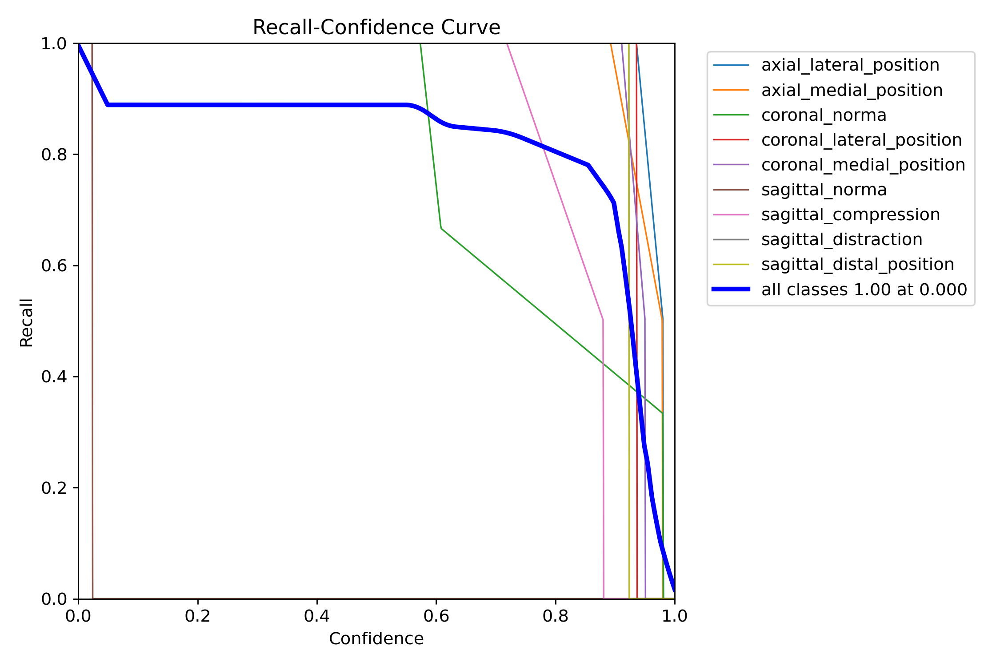

In [ ]:
#Выведем кривую  R валидационной модели,чтобы показать, как изменяются показатели запоминания при разных пороговых значениях
image_path = '/content/ultralytics/runs/detect/val/R_curve.png'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

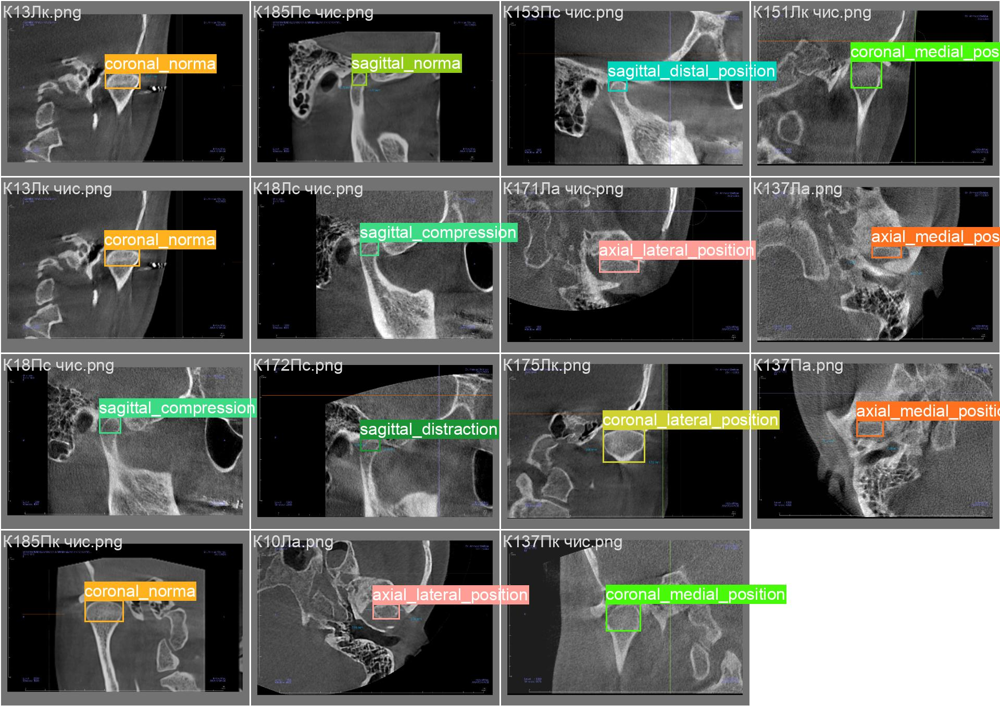

In [ ]:
#Результаты на валидационной выборке - ограничивающие прямоугольники - детектирование объектов
image_path = '/content/ultralytics/runs/detect/val/val_batch0_labels.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

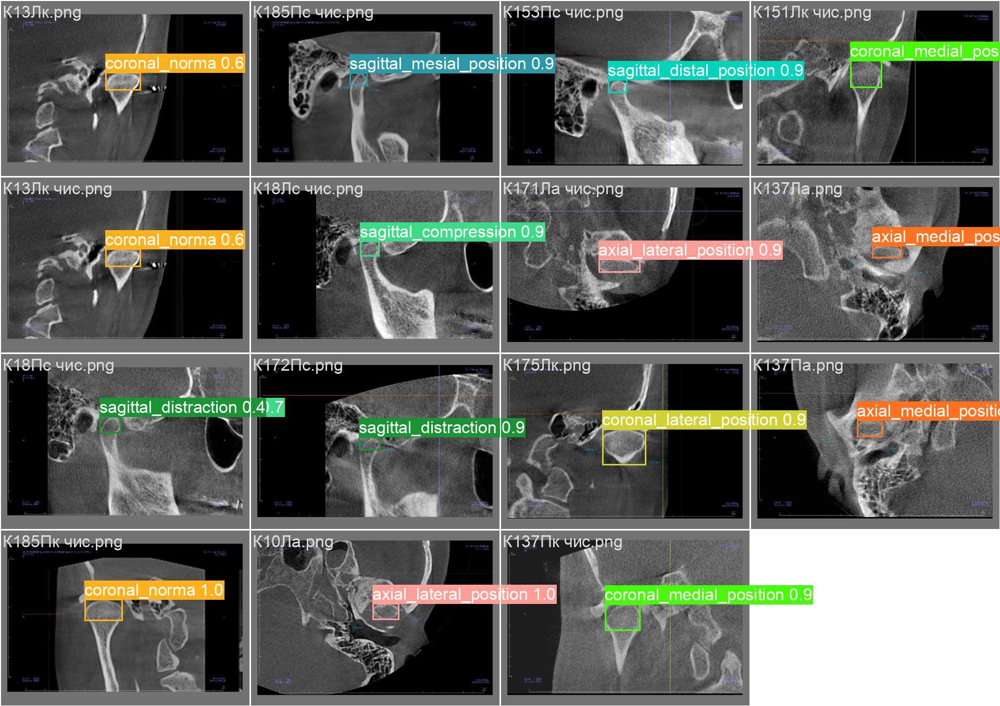

In [ ]:
#Результаты на валидационной выборке - ограничивающие прямоугольники - классификация и предсказание
image_path = '/content/ultralytics/runs/detect/val/val_batch0_pred.jpg'
# Отображение изображения в блокноте
display(Image(filename=image_path, width=1000))

# Демонстрация на одном изображении, наработки

In [ ]:
!yolo task=detect mode=predict model="/content/drive/MyDrive/Colab Notebooks/ARTdental/test/best.pt" source="/content/drive/MyDrive/Colab Notebooks/ARTdental/test/К175Пк чис.png"

Ultralytics YOLOv8.1.41 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129841 parameters, 0 gradients, 28.5 GFLOPs

image 1/1 /content/drive/MyDrive/Colab Notebooks/ARTdental/test/К175Пк чис.png: 352x512 1 coronal_lateral_position, 74.9ms
Speed: 2.6ms preprocess, 74.9ms inference, 641.1ms postprocess per image at shape (1, 3, 352, 512)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
import os
import cv2
import imutils
from google.colab.patches import cv2_imshow

# Определяем путь к тестовой выборке
detections_dir = "/content/ultralytics/runs/detect/predict2/"

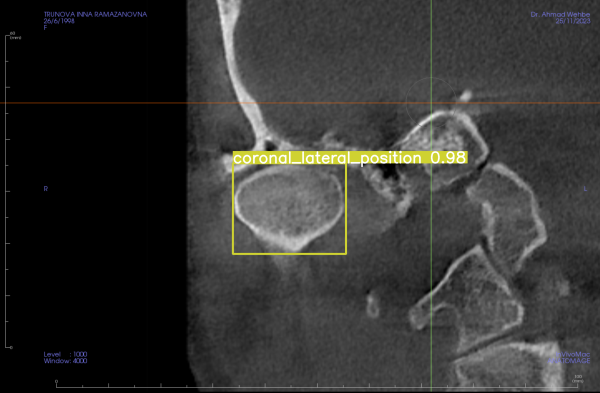

In [ ]:
# Вывод изображения с результатами детектирования
#random_detection_image = Image.open(random.choice(detection_images))
  # plt.figure(figsize = (30,10))
  # plt.imshow(np.array(random_detection_image))
for fl in os.listdir(detections_dir):
   img = cv2.imread(detections_dir+fl)
   img = imutils.resize(img, width=600)
   cv2_imshow(img)

In [ ]:
!sudo apt update
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [1,920 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,357 kB]
Fetched 3,510 kB in 3s (1,030 kB/s)
Reading package lists... Do

In [ ]:
!apt update
!apt install tesseract-ocr
!apt install libtesseract-dev

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
45 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
t

In [ ]:
!pip install pytesseract

In [ ]:
import pytesseract

# Set the path to the tesseract executable
pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'  # Update this path based on your Tesseract installation

In [ ]:
import pytesseract
from PIL import Image

# Directly use PIL to open the image
image_path = '/content/drive/MyDrive/Colab Notebooks/ARTdental/test/К175Пк чис.png'
image = Image.open(image_path)

# Use pytesseract to do OCR on the image
text = pytesseract.image_to_string(image)

print("OCR output:")
print(text)

OCR output:
TRUNOVA INNA RAMAZANOVNA
26/6/1998
-

  

Level : 1000
Window: 4000

 



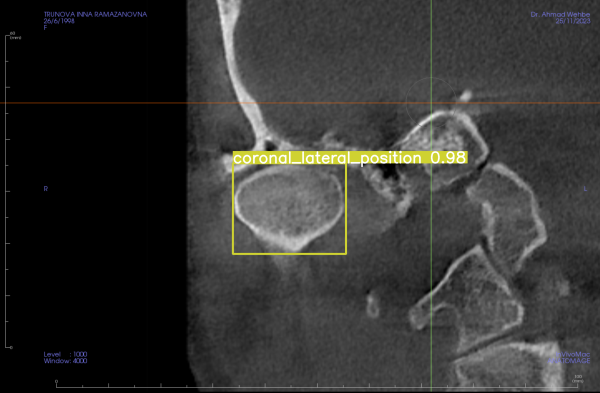

In [ ]:
import os
import cv2
import imutils
from google.colab.patches import cv2_imshow
import pytesseract
from PIL import Image, ImageDraw, ImageFont

# Функция для извлечения информации о патологии из изображения с помощью OCR
def extract_info_using_ocr(image_path):
    # Чтение изображения с помощью PIL, так как pytesseract работает с объектами PIL Image
    image = Image.open(image_path)
    # Применение OCR для получения текста с изображения
    text = pytesseract.image_to_string(image, lang='eng')
    # В этом примере предполагаем, что pytesseract возвращает текст в последней строке
    lines = text.splitlines()
    return lines[-1] if lines else ""

# Установка пути к исполняемому файлу Tesseract, если это необходимо
# pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

# Определяем путь к тестовой выборке
detections_dir = "/content/ultralytics/runs/detect/predict2/"
image_path = '/content/drive/MyDrive/Colab Notebooks/ARTdental/test/К175Пк чис.png'
image = Image.open(image_path)

# Перебор изображений и отображение с результатами детектирования и информацией о патологии
for fl in os.listdir(detections_dir):
    img_path = os.path.join(detections_dir, fl)
    # Используем функцию OCR для извлечения информации о патологии и вероятности
    extracted_text = extract_info_using_ocr(img_path)
    # Разбиваем текст на патологию и вероятность
    parts = extracted_text.split()
    if len(parts) >= 2:
        pathology = " ".join(parts[:-1])
        probability = parts[-1]
    else:
        pathology = "не обнаружено"
        probability = ""

    # Чтение и изменение размера изображения для отображения
    img = cv2.imread(img_path)
    img = imutils.resize(img, width=600)

    # Отображение изображения
    cv2_imshow(img)

    # Вывод извлеченной информации
    if pathology and probability:
        print(f"На данном изображении присутствует патология: {pathology}.")
        print(f"Вероятность этой патологии равна: {probability}.")

# Заключение

В результате исследовательской работы реализована модель анализа данных для идентификации и классификации патологий ВНЧС на основе сверточной нейронной сети YOLOv8.
Исследование показало,что мы можем использовать модель YOLO для диагностики патологий ВНЧС,но для дальнейшего прогресса и развития модели необходимо расширить набор уникальных данных в разрезе каждой патологии.
Текущие высокие результаты обучения были получены на наборе данных состоящем из 100 изображений,и из5-6 уникальных в каждой патологии. Этих данных недостаточно,чтобы получить адекватную оценку производительности и дать положительное заключение,что разработанная модель успешно справится с новыми данными.Но предпосылки для этого есть.
Анализ результатов на основе полученных метрик и классов позволяет сделать следующие выводы:

1. Общая производительность (all):

Модель достигает общей точности (P) в 77.5%, полноты (R) в 88.9%, и средней точности (mAP) на уровне 99.5% при IoU от 0.50 до 0.95. Эти показатели свидетельствуют о высокой эффективности модели в обнаружении объектов в данных.

2. Классовая Производительность:

*   axial_lateral_position:
Точность (P) для axial_lateral_position составляет 0.762, полнота (R) - 1.0, и mAP - 0.995. Модель успешно обнаруживает объекты этого класса.

*   axial_medial_position:
Точность (P) для axial_medial_position составляет 0.758, полнота (R) - 1.0, и mAP - 0.995. Модель также эффективно обнаруживает объекты axial_medial_position.

*   coronal_norma:
Точность (P) для coronal_norma составляет 0.937, полнота (R) - 1.0, и mAP - 0.995. Модель хорошо справляется с обнаружением объектов coronal_norma.

*   coronal_lateral_position:
Точность (P) для coronal_lateral_position составляет 0.581, полнота (R) - 1.0, и mAP - 0.995. Однако, точность немного ниже по сравнению с другими классами.

*   coronal_medial_position:
Точность (P) для coronal_medial_position составляет 0.627, полнота (R) - 1.0, и mAP - 0.995. Модель эффективно обнаруживает объекты coronal_medial_position.

*   sagittal_norma:
Для sagittal_norma точность (P) равна 1.0, но полнота (R) - 0.0, что может свидетельствовать о том, что модель не обнаруживает объекты этого класса.

*   sagittal_compression:
Точность (P) для sagittal_compression составляет 0.759, полнота (R) - 1.0, и mAP - 0.995. Модель хорошо справляется с обнаружением объектов sagittal_compression.

*   sagittal_distraction:
Точность (P) для sagittal_distraction составляет 0.92, полнота (R) - 1.0, и mAP - 0.995. Модель успешно обнаруживает объекты sagittal_distraction.

*  sagittal_distal_position:
Точность (P) для sagittal_distal_position составляет 0.633, полнота (R) - 1.0, и mAP - 0.995. Модель эффективно обнаруживает объекты sagittal_distal_position.


3. Общий вывод:
Модель хорошо обобщается на различные классы и способна обнаруживать объекты с высокой точностью и полнотой.
Некоторые классы, такие как sagittal_norma, могут требовать дополнительной настройки для улучшения производительности, так как полнота в данном случае равна 0.0, что может свидетельствовать о том, что модель не обнаруживает объекты этого класса.
Высокий показатель mAP 99.5% указывает на высокой точности модели в предсказаниях для различных уровней IoU.
Рекомендуется проанализировать ложные срабатывания и упущенные объекты для дальнейшего улучшения модели.